In [11]:
pip install kagglehub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [kagglehub]
Note: you may need to restart the kernel to use updated packages.


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms
import glob
import cv2

In [13]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed")

print("Path to dataset files:", path)

100%|██████████| 6.40G/6.40G [03:30<00:00, 32.6MB/s]  

Extracting files...


Path to dataset files: /home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1


In [14]:
classes = []

for root, dirs, files in os.walk(path):
    if root.lower().endswith(('cropped')):
        classes.append(root)
    print(root, "→", len(files), "arquivos")

/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1 → 0 arquivos
/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic → 0 arquivos
/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic/im_Koilocytotic → 1888 arquivos
/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic/im_Koilocytotic/CROPPED → 2475 arquivos
/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Dyskeratotic → 0 arquivos
/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Dyskeratotic/im_Dyskeratotic → 1849 arquivos
/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cer

In [15]:
classes_names = []

for file in os.listdir(path):
    classes_names.append(file)

classes_names

['im_Koilocytotic',
 'im_Dyskeratotic',
 'im_Parabasal',
 'im_Superficial-Intermediate',
 'im_Metaplastic']

In [16]:
base_paths = {}

for class_name in classes_names:
    base_paths[class_name] = classes[classes_names.index(class_name)]

base_paths

{'im_Koilocytotic': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic/im_Koilocytotic/CROPPED',
 'im_Dyskeratotic': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Dyskeratotic/im_Dyskeratotic/CROPPED',
 'im_Parabasal': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Parabasal/im_Parabasal/CROPPED',
 'im_Superficial-Intermediate': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Superficial-Intermediate/im_Superficial-Intermediate/CROPPED',
 'im_Metaplastic': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Metaplastic/im_Metaplastic/CROPPED'}

In [58]:
# Função para ler coordenadas de um .dat
def read_dat_file(dat_path):
    """
    Lê arquivo .dat contendo coordenadas (x,y) do contorno
    e retorna lista de tuplas [(x1,y1), ...]
    """
    coords = []
    with open(dat_path, 'r') as f:
        for line in f:
            line = line.strip()
            if line == "" or line.startswith("#"):
                continue
            parts = line.split(',')
            if len(parts) == 2:
                x, y = map(float, parts)
                coords.append((int(x), int(y)))
    return coords

# Função para gerar máscara multi-canal
def generate_mask_from_contours(height, width, nucleus_coords, cytoplasm_coords):
    """
    Cria máscara binária multi-canal (núcleo e citoplasma) a partir de contornos.
    """
    # Inicializa máscaras
    nucleus_mask = np.zeros((height, width), dtype=np.uint8)
    cytoplasm_mask = np.zeros((height, width), dtype=np.uint8)

    # Converte para int32
    nucleus_poly = np.array(nucleus_coords, dtype=np.int32)
    cytoplasm_poly = np.array(cytoplasm_coords, dtype=np.int32)

    # Preenche os polígonos
    cv2.fillPoly(nucleus_mask, [nucleus_poly], 1)
    cv2.fillPoly(cytoplasm_mask, [cytoplasm_poly], 1)

    # Remove sobreposição do núcleo
    cytoplasm_mask = cytoplasm_mask - nucleus_mask
    cytoplasm_mask[cytoplasm_mask < 0] = 0

    # Empilha canais
    mask = np.stack([nucleus_mask, cytoplasm_mask], axis=0)

    return mask

# Função adaptada para organizar samples
def get_samples(class_path):
    bmp_files = sorted(glob.glob(os.path.join(class_path, "*.bmp")))
    samples = []

    for bmp in bmp_files:
        name = os.path.splitext(os.path.basename(bmp))[0]
        cyt_path = os.path.join(class_path, f"{name}_cyt.dat")
        nuc_path = os.path.join(class_path, f"{name}_nuc.dat")
        if os.path.exists(cyt_path) and os.path.exists(nuc_path):
            # Lê tamanho da imagem
            img = Image.open(bmp)
            width, height = img.size

            # Lê coordenadas e gera máscara
            nucleus_coords = read_dat_file(nuc_path)
            cytoplasm_coords = read_dat_file(cyt_path)
            mask = generate_mask_from_contours(height, width, nucleus_coords, cytoplasm_coords)

            samples.append({
                "bmp": bmp,
                "cyt": cyt_path,
                "nuc": nuc_path,
                "img_array": np.array(img),
                "mask": mask
            })
    return samples

# Montar all_data com todas as classes
all_data = []
for cls, path in base_paths.items():
    samples = get_samples(path)
    for s in samples:
        s["class"] = cls
    all_data.extend(samples)

print(f"Total de amostras processadas: {len(all_data)}")

Total de amostras processadas: 4049


Visualizar máscaras:

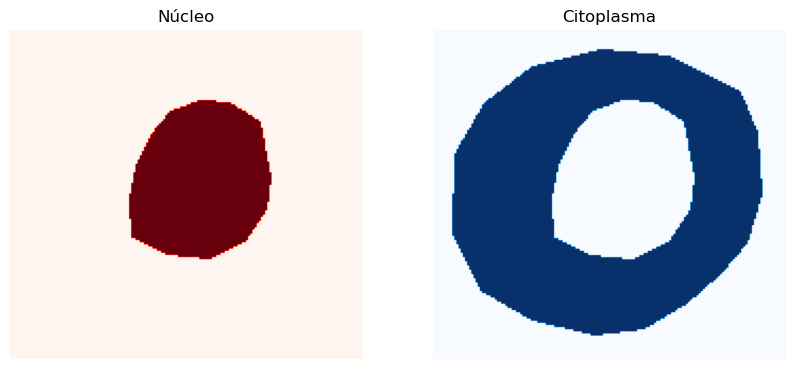

In [59]:
# Suponha que você tenha uma amostra do all_data
sample = all_data[2404]
mask = sample['mask']  # shape: (2, H, W)

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(mask[0], cmap='Reds')  # Núcleo
plt.title("Núcleo")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(mask[1], cmap='Blues')  # Citoplasma
plt.title("Citoplasma")
plt.axis("off")

plt.show()

Aplicando na UNet

In [60]:
def resize_mask(mask, size=(192,192)):
    """
    mask: numpy array (C,H,W)
    size: (height, width)
    """
    C, H, W = mask.shape
    resized = np.zeros((C, size[0], size[1]), dtype=mask.dtype)
    for c in range(C):
        resized[c] = cv2.resize(mask[c], (size[1], size[0]), interpolation=cv2.INTER_NEAREST)
    return resized

In [20]:
class CellDataset(Dataset):
    def __init__(self, data_list, transform=None, mask_size=(192,192)):
        """
        data_list: lista com dicionários do tipo all_data
        transform: transformações para as imagens
        """
        self.data_list = data_list
        self.transform = transform
        self.mask_size = mask_size

    def __len__(self):
        return len(self.data_list)

    def __getitem__(self, idx):
        sample = self.data_list[idx]
        img = Image.open(sample['bmp']).convert("RGB")
        if self.transform:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img)

        mask = resize_mask(sample['mask'], size=self.mask_size)
        mask = torch.from_numpy(mask).float()

        return img, mask

In [21]:
from torch.utils.data import DataLoader
560
# Transformações para a imagem (Tensor + Normalização)
transform = transforms.Compose([
    transforms.Resize((192, 192)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # ImageNet
])

dataset = CellDataset(all_data, transform=transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [22]:
from UNet_model import UNet, calc_loss
from collections import defaultdict

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = UNet(n_class=2).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

# Treinamento simplificado
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    for imgs, masks in dataloader:
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)  # shape: (batch, 2, H, W)
        loss = calc_loss(outputs, masks, metrics=defaultdict(float))
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}/{num_epochs} - Loss: {loss.item():.4f}")

Epoch 1/20 - Loss: 0.6483
Epoch 2/20 - Loss: 0.1761
Epoch 3/20 - Loss: 0.6722
Epoch 4/20 - Loss: 0.3150
Epoch 5/20 - Loss: 0.2269
Epoch 6/20 - Loss: 0.1015
Epoch 7/20 - Loss: 0.1706
Epoch 8/20 - Loss: 0.1937
Epoch 9/20 - Loss: 0.0891
Epoch 10/20 - Loss: 0.3892
Epoch 11/20 - Loss: 0.1075
Epoch 12/20 - Loss: 0.2587
Epoch 13/20 - Loss: 0.1474
Epoch 14/20 - Loss: 0.1220
Epoch 15/20 - Loss: 0.0513
Epoch 16/20 - Loss: 0.1937
Epoch 17/20 - Loss: 0.0866
Epoch 18/20 - Loss: 0.1120
Epoch 19/20 - Loss: 0.0918
Epoch 20/20 - Loss: 0.0504


In [61]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def masks_to_coloring(masks):
    n_classes = masks.shape[0]
    colors = np.array([
        (201, 58, 64),
        (242, 207, 1),
        (0, 152, 75),
        (101, 172, 228),
        (56, 34, 132),
        (160, 194, 56)
    ][:n_classes])  # pega apenas as cores necessárias

    colorimg = np.ones((masks.shape[1], masks.shape[2], 3), dtype=np.float32) * 255
    channels, height, width = masks.shape

    for y in range(height):
        for x in range(width):
            selected_colors = colors[masks[:,y,x] > 0.5]
            if len(selected_colors) > 0:
                colorimg[y,x,:] = np.mean(selected_colors, axis=0)

    return colorimg.astype(np.uint8)

In [62]:
print(all_data)

[{'bmp': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic/im_Koilocytotic/CROPPED/001_01.bmp', 'cyt': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic/im_Koilocytotic/CROPPED/001_01_cyt.dat', 'nuc': '/home/al.igor.alves/.cache/kagglehub/datasets/prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed/versions/1/im_Koilocytotic/im_Koilocytotic/CROPPED/001_01_nuc.dat', 'img_array': array([[[206, 197, 213],
        [209, 192, 216],
        [205, 194, 212],
        ...,
        [203, 196, 219],
        [205, 199, 212],
        [206, 198, 211]],

       [[204, 194, 218],
        [206, 190, 217],
        [200, 196, 212],
        ...,
        [200, 199, 214],
        [201, 199, 210],
        [203, 199, 207]],

       [[199, 197, 218],
        [198, 199, 217],
        [195, 199, 214],
        ...,
        [198, 199, 215

In [65]:
import os
import cv2
import numpy as np
from PIL import Image
import torch
from torchvision import transforms

# === Pastas base ===
save_dir_imgs = "img"
save_dir_masks = "mask"
os.makedirs(save_dir_imgs, exist_ok=True)
os.makedirs(save_dir_masks, exist_ok=True)

# === Transformações para o modelo ===
transform = transforms.Compose([
    transforms.Resize((192, 192)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

model.eval()
device = next(model.parameters()).device  # garante mesmo device do modelo

with torch.no_grad():
    for k, item in enumerate(all_data):
        # --- Verifica chave bmp ---
        if "bmp" not in item:
            print(f"⚠️ Pulando item {k}: sem chave 'bmp'")
            continue

        # --- Classes ---
        if "class" not in item:
            classes = ["unknown"]
        else:
            classes = item["class"]
            if isinstance(classes, str):
                classes = [classes]

        # --- Carregar imagem original ---
        img_cell = Image.open(item["bmp"]).convert("RGB")
        orig_w, orig_h = img_cell.size

        # --- Inferência ---
        img_tensor = transform(img_cell).unsqueeze(0).to(device)
        pred = model(img_tensor)
        pred = torch.sigmoid(pred)
        pred = pred.cpu().numpy()[0]

        # --- Converter para máscara colorida ---
        pred_color = masks_to_coloring(pred)
        mask_rgb = (pred_color * 255).astype(np.uint8) if pred_color.max() <= 1 else pred_color.astype(np.uint8)

        # --- Extrair amarelo para invólucro convexo ---
        hsv = cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2HSV)
        lower_yellow = np.array([15, 80, 80])
        upper_yellow = np.array([40, 255, 255])
        mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)

        contours, _ = cv2.findContours(mask_yellow, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(contours) > 0:
            points = np.concatenate(contours)
            hull = cv2.convexHull(points)
            filled_hull = np.zeros_like(mask_yellow)
            cv2.fillConvexPoly(filled_hull, hull, 255)
            mask_rgb[filled_hull == 255] = [255, 255, 0]  # amarelo puro

        # --- Redimensionar máscara para o tamanho original ---
        mask_resized = cv2.resize(mask_rgb, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

        # --- Salvar imagem e máscara em subpastas por classe ---
        for cls in classes:
            # Subpastas de imagens
            img_cls_dir = os.path.join(save_dir_imgs, cls)
            os.makedirs(img_cls_dir, exist_ok=True)
            img_path = os.path.join(img_cls_dir, f"img_{k:03d}.png")
            img_cell.save(img_path)

            # Subpastas de máscaras
            mask_cls_dir = os.path.join(save_dir_masks, cls)
            os.makedirs(mask_cls_dir, exist_ok=True)
            mask_path = os.path.join(mask_cls_dir, f"mask_{k:03d}.png")
            Image.fromarray(mask_resized).save(mask_path)

            print(f"✅ [{cls}] Salvo: {img_path} | {mask_path}")

print("\n🎉 Finalizado! Todas as imagens e máscaras salvas nas subpastas por classe.")


✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_000.png | mask/im_Koilocytotic/mask_000.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_001.png | mask/im_Koilocytotic/mask_001.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_002.png | mask/im_Koilocytotic/mask_002.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_003.png | mask/im_Koilocytotic/mask_003.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_004.png | mask/im_Koilocytotic/mask_004.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_005.png | mask/im_Koilocytotic/mask_005.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_006.png | mask/im_Koilocytotic/mask_006.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_007.png | mask/im_Koilocytotic/mask_007.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_008.png | mask/im_Koilocytotic/mask_008.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img_009.png | mask/im_Koilocytotic/mask_009.png
✅ [im_Koilocytotic] Salvo: img/im_Koilocytotic/img

In [ ]:
acessar data
pra cada subpasta em data/img pegar um arquivo img_xxx onde xxx vai de 000 ate 4048
pegar o respectivo em data/mask/subpasta

criar pasta imgmask 
na pasta imgmask salvar png da mask_xxx sobreposta a img_xxx aonde mask_xxx em uma subpasta com o mesmo nome das subpastas acessadas nao e branca colocar os pixels de img_xxx e o resto deixar branco

In [67]:
import os
import numpy as np
from PIL import Image

# --- Caminhos base ---
data_dir = "data"
img_dir = os.path.join(data_dir, "img")
mask_dir = os.path.join(data_dir, "mask")
imgmask_dir = os.path.join(data_dir, "imgmask")
os.makedirs(imgmask_dir, exist_ok=True)

# --- Percorrer subpastas de imagens ---
for cls in os.listdir(img_dir):
    img_cls_dir = os.path.join(img_dir, cls)
    mask_cls_dir = os.path.join(mask_dir, cls)
    imgmask_cls_dir = os.path.join(imgmask_dir, cls)
    os.makedirs(imgmask_cls_dir, exist_ok=True)

    if not os.path.isdir(img_cls_dir):
        continue  # ignora arquivos que não são pastas

    # --- Loop pelas imagens numeradas ---
    for i in range(4049):  # 000 até 4048
        img_path = os.path.join(img_cls_dir, f"img_{i:03d}.png")
        mask_path = os.path.join(mask_cls_dir, f"mask_{i:03d}.png")
        out_path = os.path.join(imgmask_cls_dir, f"imgmask_{i:03d}.png")

        if not os.path.exists(img_path) or not os.path.exists(mask_path):
            print(f"⚠️ Pulando {cls}/img_{i:03d} (arquivo ausente)")
            continue

        # --- Carregar imagem e máscara ---
        img = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("RGB"))

        # --- Identificar pixels não brancos na máscara ---
        non_white = np.any(mask < 250, axis=-1)  # True onde máscara não é branca

        # --- Criar fundo branco ---
        result = np.ones_like(img, dtype=np.uint8) * 0

        # --- Copiar pixels da imagem onde máscara não é branca ---
        result[non_white] = img[non_white]

        # --- Salvar resultado ---
        Image.fromarray(result).save(out_path)
        print(f"✅ Gerado: {out_path}")

print("\n🎉 Finalizado! Todas as imagens sobrepostas salvas em 'imgmask' por classe.")


✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_000.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_001.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_002.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_003.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_004.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_005.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_006.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_007.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_008.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_009.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_010.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_011.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_012.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_013.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_014.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_015.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_016.png
✅ Gerado: data/imgmask/im_Koilocytotic/imgmask_017.png
✅ Gerado: 

In [ ]:
sample_index = 1

img_cell= Image.open(all_data[sample_index]['bmp']).convert("RGB")

print(img_cell)
# Transformações
transform = transforms.Compose([
    transforms.Resize((192, 192)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

img_tensor = transform(img_cell).unsqueeze(0).to(device)

# Inferência
model.eval()
with torch.no_grad():
    pred = model(img_tensor)
    pred = torch.sigmoid(pred)
    pred = pred.cpu().numpy()[0]  # shape: (C, H, W)

pred_color = masks_to_coloring(pred)
mask = all_data[sample_index]['mask']  # shape: (2, H, W)

# Plot 2x2
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.imshow(img_cell)
plt.axis("off")
plt.title("Imagem Original")

plt.subplot(2, 2, 2)
plt.imshow(pred_color)
plt.axis("off")
plt.title("Máscara Predita")

plt.subplot(2, 2, 3)
plt.imshow(mask[0], cmap='Reds')
plt.axis("off")
plt.title("Núcleo - Real (.dat)")

plt.subplot(2, 2, 4)
plt.imshow(mask[1], cmap='Blues')
plt.axis("off")
plt.title("Citoplasma - Real (.dat)")

plt.tight_layout()
plt.show()


KeyError: 1

In [27]:
print(len(mask))

2


In [ ]:
# Unet model:
import matplotlib.pyplot as plt
import numpy as np
import random
from functools import reduce
import itertools
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models
from collections import defaultdict
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn as nn
from torch.nn.functional import relu


class UNet(nn.Module):
    def __init__(self, n_class):
        super().__init__()

        # Encoder
        # In the encoder, convolutional layers with the Conv2d function are used to extract features from the input image.
        # Each block in the encoder consists of two convolutional layers followed by a max-pooling layer, with the exception of the last block which does not include a max-pooling layer.
        # input: 572x572x3
        self.e11 = nn.Conv2d(3, 64, kernel_size=3, padding=1) # output: 570x570x64
        self.e12 = nn.Conv2d(64, 64, kernel_size=3, padding=1) # output: 568x568x64
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 284x284x64

        # input: 284x284x64
        self.e21 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # output: 282x282x128
        self.e22 = nn.Conv2d(128, 128, kernel_size=3, padding=1) # output: 280x280x128
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 140x140x128

        # input: 140x140x128
        self.e31 = nn.Conv2d(128, 256, kernel_size=3, padding=1) # output: 138x138x256
        self.e32 = nn.Conv2d(256, 256, kernel_size=3, padding=1) # output: 136x136x256
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 68x68x256

        # input: 68x68x256
        self.e41 = nn.Conv2d(256, 512, kernel_size=3, padding=1) # output: 66x66x512
        self.e42 = nn.Conv2d(512, 512, kernel_size=3, padding=1) # output: 64x64x512
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 32x32x512

        # input: 32x32x512
        self.e51 = nn.Conv2d(512, 1024, kernel_size=3, padding=1) # output: 30x30x1024
        self.e52 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1) # output: 28x28x1024


        # Decoder
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.d11 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.d12 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.d21 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.d22 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.d31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.d32 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.d41 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.d42 = nn.Conv2d(64, 64, kernel_size=3, padding=1)

        # Output layer
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)


    def forward(self, x):
        # Encoder
        xe11 = relu(self.e11(x))
        xe12 = relu(self.e12(xe11))
        xp1 = self.pool1(xe12)

        xe21 = relu(self.e21(xp1))
        xe22 = relu(self.e22(xe21))
        xp2 = self.pool2(xe22)

        xe31 = relu(self.e31(xp2))
        xe32 = relu(self.e32(xe31))
        xp3 = self.pool3(xe32)

        xe41 = relu(self.e41(xp3))
        xe42 = relu(self.e42(xe41))
        xp4 = self.pool4(xe42)

        xe51 = relu(self.e51(xp4))
        xe52 = relu(self.e52(xe51))

        # Decoder
        xu1 = self.upconv1(xe52)
        xu11 = torch.cat([xu1, xe42], dim=1)
        xd11 = relu(self.d11(xu11))
        xd12 = relu(self.d12(xd11))

        xu2 = self.upconv2(xd12)
        xu22 = torch.cat([xu2, xe32], dim=1)
        xd21 = relu(self.d21(xu22))
        xd22 = relu(self.d22(xd21))

        xu3 = self.upconv3(xd22)
        xu33 = torch.cat([xu3, xe22], dim=1)
        xd31 = relu(self.d31(xu33))
        xd32 = relu(self.d32(xd31))

        xu4 = self.upconv4(xd32)
        xu44 = torch.cat([xu4, xe12], dim=1)
        xd41 = relu(self.d41(xu44))
        xd42 = relu(self.d42(xd41))

        # Output layer
        out = self.outconv(xd42)

        return out




def plot_img_array(img_array, ncol=3):
    nrow = len(img_array) // ncol

    f, plots = plt.subplots(nrow, ncol, sharex='all', sharey='all', figsize=(ncol * 4, nrow * 4))

    for i in range(len(img_array)):
        plots[i // ncol, i % ncol].imshow(img_array[i])
        plots[i // ncol, i % ncol].axis("off")

    plt.tight_layout()
    plt.show()


def plot_errors(results_dict, title):
    markers = itertools.cycle(('+', 'x', 'o'))

    plt.title('{}'.format(title))

    for label, result in sorted(results_dict.items()):
        plt.plot(result, marker=next(markers), label=label)
        plt.ylabel('dice_coef')
        plt.xlabel('epoch')
        plt.legend(loc=3, bbox_to_anchor=(1, 0))

    plt.show()


def reverse_transform(inp):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    inp = (inp * 255).astype(np.uint8)

    return inp


def dice_loss(pred, target, smooth=1.):
    pred = pred.contiguous()
    target = target.contiguous()

    intersection = (pred * target).sum(dim=2).sum(dim=2)

    loss = (1 - ((2. * intersection + smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + smooth)))

    return loss.mean()


def calc_loss(pred, target, metrics, bce_weight=0.5):
    bce = F.binary_cross_entropy_with_logits(pred, target)

    pred = F.sigmoid(pred)
    dice = dice_loss(pred, target)

    loss = bce * bce_weight + dice * (1 - bce_weight)

    metrics['bce'] += bce.data.cpu().numpy() * target.size(0)
    metrics['dice'] += dice.data.cpu().numpy() * target.size(0)
    metrics['loss'] += loss.data.cpu().numpy() * target.size(0)

    return loss


def print_metrics(metrics, epoch_samples, phase):
    outputs = []
    for k in metrics.keys():
        outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_samples))

    print("{}: {}".format(phase, ", ".join(outputs)))
